In [1]:
from tqdm import tqdm
import os
import pandas as pd
import numpy as np
from PIL import Image
import plotly.express as px

## Preparing the dataframe with image file names and attributes

In [2]:
data_path = '../data/wild_images'

In [3]:
part1_images = os.listdir(os.path.join(data_path, 'part1'))

In [4]:
part2_images = os.listdir(os.path.join(data_path, 'part2'))
part3_images = os.listdir(os.path.join(data_path, 'part3'))

In [5]:
len(part1_images), len(part2_images), len(part3_images)

(10137, 10719, 3253)

In [6]:
part1_df = pd.DataFrame({'file_path':part1_images})

In [7]:
part2_df = pd.DataFrame({'file_path':part2_images})
part3_df = pd.DataFrame({'file_path':part3_images})

In [8]:
part1_df['subfolder'] = 'part1'
part1_df.head()

,file_path,subfolder
0,28_1_3_20170104231433217.jpg,part1
1,7_0_0_20170110215612275.jpg,part1
2,16_0_0_20170110231736665.jpg,part1
3,36_0_0_20170105164112403.jpg,part1
4,1_1_1_20170109190848182.jpg,part1


In [9]:
part2_df['subfolder'] = 'part2'
part3_df['subfolder'] = 'part3'

In [10]:
part2_df.head()

,file_path,subfolder
0,54_1_0_20170117191238426.jpg,part2
1,36_0_0_20170117163601353.jpg,part2
2,35_0_2_20170117191648050.jpg,part2
3,56_0_0_20170113210319631.jpg,part2
4,70_0_0_20170117175004342.jpg,part2


In [11]:
part3_df.head()

,file_path,subfolder
0,45_0_3_20170119212016521.jpg,part3
1,37_0_3_20170119202215718.jpg,part3
2,26_1_0_20170120134302655.jpg,part3
3,23_0_0_20170119145312190.jpg,part3
4,23_1_3_20170119164555733.jpg,part3


In [12]:
full_df = pd.concat([part1_df, part2_df, part3_df])

In [13]:
full_df = full_df.sample(frac=1).reset_index(drop=True)

In [14]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24109 entries, 0 to 24108
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  24109 non-null  object
 1   subfolder  24109 non-null  object
dtypes: object(2)
memory usage: 376.8+ KB


In [15]:
full_df.head()

,file_path,subfolder
0,26_0_1_20170116233450112.jpg,part3
1,31_1_2_20170104020444076.jpg,part1
2,63_0_0_20170111200740138.jpg,part1
3,9_0_0_20170110215848132.jpg,part1
4,31_0_0_20170109004623215.jpg,part1


In [16]:
full_df['age'] = full_df['file_path'].apply(lambda x : x.split('_')[0])

In [18]:
full_df['sex'] = full_df['file_path'].apply(lambda x : x.split('_')[1])

In [20]:
full_df['attributes'] = full_df['file_path'].apply(lambda x : x.split('_'))

In [21]:
full_df.head()

,file_path,subfolder,age,sex,attributes
0,26_0_1_20170116233450112.jpg,part3,26,0,"[26, 0, 1, 20170116233450112.jpg]"
1,31_1_2_20170104020444076.jpg,part1,31,1,"[31, 1, 2, 20170104020444076.jpg]"
2,63_0_0_20170111200740138.jpg,part1,63,0,"[63, 0, 0, 20170111200740138.jpg]"
3,9_0_0_20170110215848132.jpg,part1,9,0,"[9, 0, 0, 20170110215848132.jpg]"
4,31_0_0_20170109004623215.jpg,part1,31,0,"[31, 0, 0, 20170109004623215.jpg]"


In [22]:
full_df['attributes_len'] = full_df['attributes'].apply(lambda x : len(x))

In [24]:
full_df.groupby('attributes_len')['attributes_len'].count()

attributes_len
2        1
3        3
4    24105
Name: attributes_len, dtype: int64

In [26]:
# removing these as they do not have all attributes information
full_df[full_df.attributes_len != 4]

,file_path,subfolder,age,sex,attributes,attributes_len
7047,61_1_20170109142408075.jpg,part1,61,1,"[61, 1, 20170109142408075.jpg]",3
7480,.DS_Store,part3,.DS,Store,"[.DS, Store]",2
12368,61_3_20170109150557335.jpg,part1,61,3,"[61, 3, 20170109150557335.jpg]",3
21049,39_1_20170116174525125.jpg,part2,39,1,"[39, 1, 20170116174525125.jpg]",3


In [27]:
full_df = full_df[full_df.attributes_len == 4]

In [30]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24105 entries, 0 to 24108
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   file_path       24105 non-null  object
 1   subfolder       24105 non-null  object
 2   age             24105 non-null  object
 3   sex             24105 non-null  object
 4   attributes      24105 non-null  object
 5   attributes_len  24105 non-null  int64 
dtypes: int64(1), object(5)
memory usage: 1.3+ MB


In [40]:
full_df = full_df[full_df.sex != '']
full_df = full_df.sample(frac=1).reset_index(drop=True)

In [33]:
# sex 0 is male and 1 is female
# race 0 to 4, denoting White, Black, Asian, Indian, and Others (like Hispanic, Latino, Middle Eastern)
full_df = full_df.drop(columns = ['attributes_len', 'attributes'])
full_df.head()

,file_path,subfolder,age,sex
0,74_1_0_20170120225056705.jpg,part3,74,1
1,75_0_2_20170112205312755.jpg,part2,75,0
2,30_1_0_20170117143933875.jpg,part2,30,1
3,35_1_3_20170119201543070.jpg,part3,35,1
4,25_0_1_20170117140732133.jpg,part2,25,0


In [51]:
full_df['race'] = full_df['file_path'].apply(lambda x : x.split('_')[2])

In [52]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24104 entries, 0 to 24103
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  24104 non-null  object
 1   subfolder  24104 non-null  object
 2   age        24104 non-null  object
 3   sex        24104 non-null  object
 4   race       24104 non-null  object
dtypes: object(5)
memory usage: 941.7+ KB


In [58]:
# converting the attributes to integer datatype
full_df['age'] = pd.to_numeric(full_df['age'])
full_df['sex'] = pd.to_numeric(full_df['sex'])
full_df['race'] = pd.to_numeric(full_df['race'])

In [59]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24104 entries, 0 to 24103
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  24104 non-null  object
 1   subfolder  24104 non-null  object
 2   age        24104 non-null  int64 
 3   sex        24104 non-null  int64 
 4   race       24104 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 941.7+ KB


## Lets see distribution of attributes

In [60]:
full_df.groupby('sex')['sex'].count()

sex
0    12582
1    11522
Name: sex, dtype: int64

In [62]:
full_df.groupby('age')['age'].count()

age
1      1282
2       531
3       308
4       283
5       209
       ... 
105       5
110       6
111       1
115       3
116       4
Name: age, Length: 104, dtype: int64

In [63]:
full_df.groupby('race')['race'].count()

race
0    10222
1     4558
2     3586
3     4027
4     1711
Name: race, dtype: int64

In [68]:
### Lets convert the age to different brackets
def get_age_bracket(age):
    if age <= 10:
        return '0_to_10'
    elif age <= 20:
        return '10_to_20'
    elif age <= 30:
        return '20_to_30'
    elif age <= 40:
        return '30_to_40'
    elif age <= 50:
        return '40_to_50'
    elif age <= 60:
        return '50_to_60'
    elif age <= 70:
        return '60_to_70'
    elif age <= 80:
        return '70_to_80'
    elif age >80:
        return 'above_80'
full_df['age_range'] = full_df['age'].apply(lambda x : get_age_bracket(x))

In [69]:
full_df.head()

,file_path,subfolder,age,sex,race,age_range
0,35_0_2_20170116175138888.jpg,part2,35,0,2,30_to_40
1,42_0_4_20170104202126618.jpg,part1,42,0,4,40_to_50
2,9_0_0_20170110220449969.jpg,part1,9,0,0,0_to_10
3,30_1_0_20170103182425185.jpg,part1,30,1,0,20_to_30
4,38_1_1_20170117170520535.jpg,part2,38,1,1,30_to_40


In [71]:
result = full_df.groupby('age_range')['age_range'].count()
result

age_range
0_to_10     3492
10_to_20    1682
20_to_30    7806
30_to_40    4345
40_to_50    2104
50_to_60    2226
60_to_70    1183
70_to_80     701
above_80     565
Name: age_range, dtype: int64

In [72]:
px.bar(result)

In [74]:
# save as csv file
full_df.to_csv(os.path.join(data_path,'full_wild_images.csv'), index=False)

In [75]:
# lets look at the resolution of all the images
def get_image_size(path):
    im = Image.open(path)
    width, height = im.size
    return (width, height)

In [80]:
tqdm.pandas()

In [81]:
full_df['image_size'] = full_df.progress_apply(lambda x : get_image_size(os.path.join(data_path, x['subfolder'], x['file_path'])), 
                                      axis=1)

100%|██████████| 24104/24104 [00:01<00:00, 14933.12it/s]


In [84]:
full_df['image_width'] = full_df['image_size'].apply(lambda x : int(x[0]))
full_df['image_height'] = full_df['image_size'].apply(lambda x : int(x[1]))

In [85]:
full_df.head()

,file_path,subfolder,age,sex,race,age_range,image_size,image_width,image_height
0,35_0_2_20170116175138888.jpg,part2,35,0,2,30_to_40,"(1118, 727)",1118,727
1,42_0_4_20170104202126618.jpg,part1,42,0,4,40_to_50,"(452, 451)",452,451
2,9_0_0_20170110220449969.jpg,part1,9,0,0,0_to_10,"(2848, 4272)",2848,4272
3,30_1_0_20170103182425185.jpg,part1,30,1,0,20_to_30,"(386, 525)",386,525
4,38_1_1_20170117170520535.jpg,part2,38,1,1,30_to_40,"(690, 1179)",690,1179


In [86]:
# The images present are in very wide range of width and height.. some are extremely large and small
# some 4k and 8k images might be present
# other problems with some data points is that some images have more than one people and crowd of people which may
# cause problems
full_df[['image_width','image_height']].describe()

,image_width,image_height
count,24104.000000,24104.000000
mean,637.665948,662.164247
std,396.581305,384.604077
min,87.000000,69.000000
25%,386.000000,389.000000
50%,558.000000,643.000000
75%,806.000000,852.250000
max,8198.000000,8739.000000


In [89]:
# Lets check very large images
full_df[full_df.image_width > 8000]

,file_path,subfolder,age,sex,race,age_range,image_size,image_width,image_height
806,32_1_0_20170113210605443.jpg,part2,32,1,0,30_to_40,"(8006, 5335)",8006,5335
13568,65_0_0_20170113190804729.jpg,part2,65,0,0,60_to_70,"(8198, 6147)",8198,6147


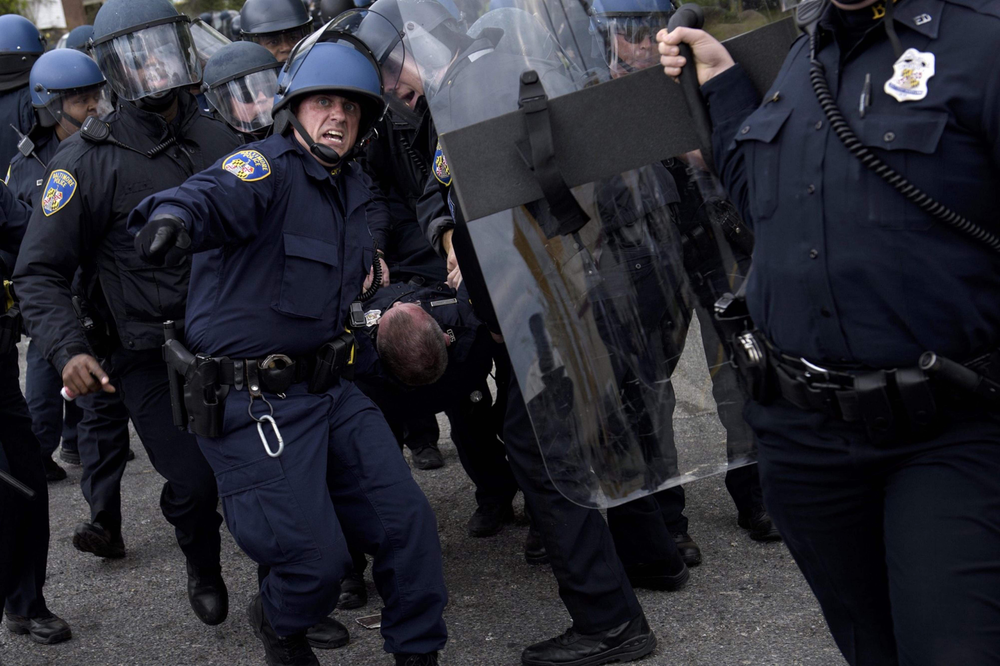

In [98]:
# too many people here. Such type of images might incorrectly bias the model
Image.open(os.path.join(data_path, 'part2', '32_1_0_20170113210605443.jpg'))

In [99]:
# Lets check very small images
full_df[full_df.image_width < 100]

,file_path,subfolder,age,sex,race,age_range,image_size,image_width,image_height
226,1_0_3_20161219225032897.jpg,part1,1,0,3,0_to_10,"(98, 164)",98,164
1400,2_0_3_20161219224627007.jpg,part1,2,0,3,0_to_10,"(98, 164)",98,164
1914,3_1_3_20161219225423312.jpg,part1,3,1,3,0_to_10,"(98, 164)",98,164
8341,3_1_3_20161219225830840.jpg,part1,3,1,3,0_to_10,"(98, 164)",98,164
10571,1_0_2_20161219161626814.jpg,part1,1,0,2,0_to_10,"(94, 160)",94,160
13404,1_1_3_20161219225945416.jpg,part1,1,1,3,0_to_10,"(89, 164)",89,164
13897,2_1_3_20161219225920200.jpg,part1,2,1,3,0_to_10,"(97, 164)",97,164
16069,2_1_2_20161219151217243.jpg,part1,2,1,2,0_to_10,"(93, 164)",93,164
18045,1_1_2_20161219141954401.jpg,part1,1,1,2,0_to_10,"(87, 69)",87,69
18692,3_0_2_20161219141852353.jpg,part1,3,0,2,0_to_10,"(98, 152)",98,152


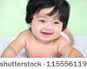

In [102]:
# perhaps we can ignore smaller images having height or width less than 100.. because resizing to higher resoultion
# can be problematic
Image.open(os.path.join(data_path, 'part1', '1_1_2_20161219141954401.jpg'))

In [107]:
full_df = full_df[((full_df.image_width >=100) & (full_df.image_height >= 100))]

In [108]:
full_df = full_df.sample(frac=1).reset_index(drop=True)

In [109]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24087 entries, 0 to 24086
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   file_path     24087 non-null  object
 1   subfolder     24087 non-null  object
 2   age           24087 non-null  int64 
 3   sex           24087 non-null  int64 
 4   race          24087 non-null  int64 
 5   age_range     24087 non-null  object
 6   image_size    24087 non-null  object
 7   image_width   24087 non-null  int64 
 8   image_height  24087 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 1.7+ MB


In [110]:
result = full_df.groupby('age_range')['age_range'].count()
result

age_range
0_to_10     3475
10_to_20    1682
20_to_30    7806
30_to_40    4345
40_to_50    2104
50_to_60    2226
60_to_70    1183
70_to_80     701
above_80     565
Name: age_range, dtype: int64

In [112]:
full_df.to_csv(os.path.join(data_path, 'full_wild_images_new.csv'), index=False)

In [42]:
## Checking if all the images are coloured otherwise discarding non-colour images
full_df = pd.read_csv(os.path.join(data_path, 'full_wild_images_new.csv'))

In [43]:
full_df

,file_path,subfolder,age,sex,race,age_range,image_size,image_width,image_height
0,49_1_0_20170103181021153.jpg,part1,49,1,0,40_to_50,"(452, 451)",452,451
1,24_1_2_20170116164813386.jpg,part2,24,1,2,20_to_30,"(762, 1067)",762,1067
2,34_0_0_20170117203207119.jpg,part2,34,0,0,30_to_40,"(758, 883)",758,883
3,27_1_2_20170116172637915.jpg,part2,27,1,2,20_to_30,"(698, 731)",698,731
4,15_0_0_20170110225033368.jpg,part1,15,0,0,10_to_20,"(460, 288)",460,288
...,...,...,...,...,...,...,...,...,...
24082,21_0_1_20170113133205762.jpg,part2,21,0,1,20_to_30,"(702, 699)",702,699
24083,16_0_0_20170110231529568.jpg,part1,16,0,0,10_to_20,"(1600, 1071)",1600,1071
24084,21_0_1_20170116214205175.jpg,part3,21,0,1,20_to_30,"(272, 377)",272,377
24085,10_0_0_20170110220251986.jpg,part1,10,0,0,0_to_10,"(882, 1024)",882,1024


In [44]:
def get_mode(filepath, subfolder):
    sample = Image.open(os.path.join(data_path, subfolder, filepath))
    return str(sample.mode)

In [45]:
full_df['mode'] = full_df.apply(lambda x : get_mode(x['file_path'], x['subfolder']), axis=1)

In [47]:
full_df.head()

,file_path,subfolder,age,sex,race,age_range,image_size,image_width,image_height,mode
0,49_1_0_20170103181021153.jpg,part1,49,1,0,40_to_50,"(452, 451)",452,451,RGB
1,24_1_2_20170116164813386.jpg,part2,24,1,2,20_to_30,"(762, 1067)",762,1067,RGB
2,34_0_0_20170117203207119.jpg,part2,34,0,0,30_to_40,"(758, 883)",758,883,RGB
3,27_1_2_20170116172637915.jpg,part2,27,1,2,20_to_30,"(698, 731)",698,731,RGB
4,15_0_0_20170110225033368.jpg,part1,15,0,0,10_to_20,"(460, 288)",460,288,RGB


In [48]:
full_df.groupby('mode')['mode'].count()

mode
L          11
RGB     24067
RGBA        9
Name: mode, dtype: int64

In [49]:
# lets consider only RGB images for our dataset
full_df = full_df[full_df['mode'] == 'RGB']

In [50]:
full_df = full_df.sample(frac=1).reset_index(drop=True)

In [51]:
full_df

,file_path,subfolder,age,sex,race,age_range,image_size,image_width,image_height,mode
0,34_0_1_20170112213542279.jpg,part2,34,0,1,30_to_40,"(646, 643)",646,643,RGB
1,32_1_0_20170109141308065.jpg,part1,32,1,0,30_to_40,"(638, 319)",638,319,RGB
2,35_1_0_20170116211804087.jpg,part2,35,1,0,30_to_40,"(930, 875)",930,875,RGB
3,21_0_0_20170104020830476.jpg,part1,21,0,0,20_to_30,"(900, 601)",900,601,RGB
4,27_1_2_20170104020523491.jpg,part1,27,1,2,20_to_30,"(518, 601)",518,601,RGB
...,...,...,...,...,...,...,...,...,...,...
24062,26_0_4_20170117153015117.jpg,part2,26,0,4,20_to_30,"(506, 691)",506,691,RGB
24063,38_0_0_20170117121550630.jpg,part2,38,0,0,30_to_40,"(1106, 735)",1106,735,RGB
24064,29_0_1_20170117103814669.jpg,part2,29,0,1,20_to_30,"(910, 895)",910,895,RGB
24065,1_1_4_20161221202254377.jpg,part1,1,1,4,0_to_10,"(392, 513)",392,513,RGB


In [52]:
full_df.to_csv(os.path.join(data_path, 'full_wild_images_new.csv'), index=False)